##### imports & constants

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import cv2, copy
from skimage.feature import sift
root = 'C:\\Users\\Koorosh\\Desktop\\DIP_HW4\\inputs\\P2\\{}\\{}'
_aut = [root.format('I','aut_{}.png'.format(i+1)) for i in range(3)]
_cmp = [root.format('II','campnou_{}.png'.format(i+1)) for i in range(4)]
_trp = [root.format('III','trump_tower_{}.png'.format(i+1)) for i in range(9)]

##### 2.a

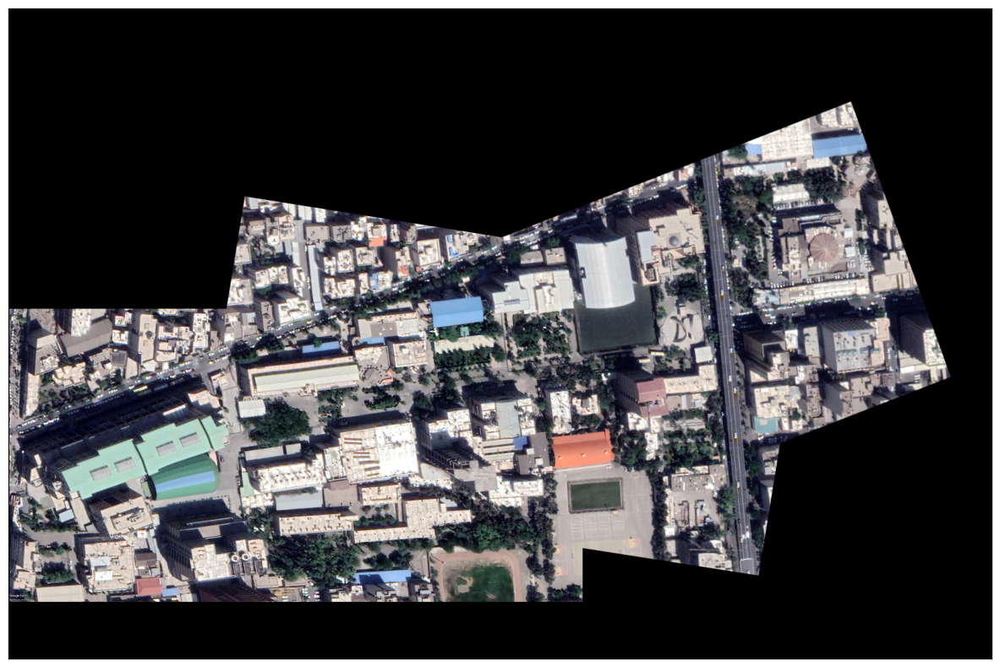

In [27]:
def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H'''
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    result = cv2.warpPerspective(img2, Ht@H, (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1], t[0]:w1+t[0]] = img1
    return result

def stitchTwoImages(img1, img2):
    sift = cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)
    matcher = cv2.BFMatcher()
    matches12 = matcher.match(des1, des2)
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches12 ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches12 ]).reshape(-1,1,2)
    H_1_2, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)
    registered_img = warpTwoImages(img2, img1, H_1_2)    
    return registered_img


img = [cv2.imread(__aut) for __aut in _aut]
for i in range(len(img)-1): stitch = stitchTwoImages(img[i],img[i+1]) if i==0 else stitchTwoImages(stitch,img[i+1])

# Display the blended image
# cv2.imshow('Blended Image', blended_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(cv2.cvtColor(stitch, cv2.COLOR_BGR2RGB))
ax.set_xticks([])
ax.set_yticks([])
plt.show()

##### 2.b

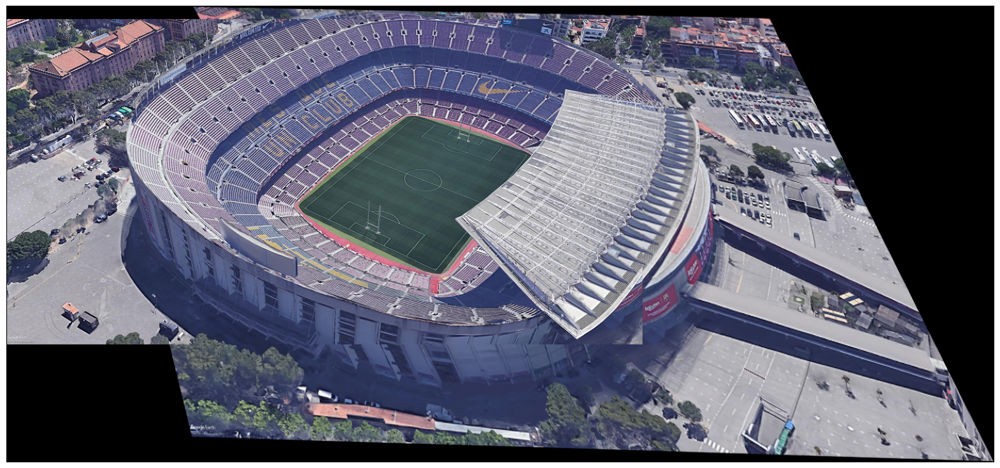

In [34]:
img = [cv2.imread(__cmp) for __cmp in _cmp]
for i in range(len(img)-1): stitch = stitchTwoImages(img[i],img[i+1]) if i==0 else stitchTwoImages(stitch,img[i+1])

fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(cv2.cvtColor(stitch, cv2.COLOR_BGR2RGB))
ax.set_xticks([])
ax.set_yticks([])
plt.show()

##### 2.c

In [26]:
def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H'''
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    result = cv2.warpPerspective(img2, Ht@H, (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1], t[0]:w1+t[0]] = img1
    return result

def stitchTwoImages(img1, img2):
    sift = cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)
    matcher = cv2.BFMatcher()
    matches12 = matcher.match(des1, des2)
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches12 ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches12 ]).reshape(-1,1,2)
    H_1_2, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)
    registered_img = warpTwoImages(img2, img1, H_1_2)    
    return registered_img


In [57]:
img = [cv2.imread(__trp) for __trp in _trp]
stitch = stitchTwoImages(img[0],img[1])
stitch = stitchTwoImages(img[2],stitch)
stitch = stitchTwoImages(img[3],stitch)
stitch = stitchTwoImages(img[4],stitch)

stitch2 = stitchTwoImages(img[5],img[6])
stitch2 = stitchTwoImages(img[7],stitch2)
stitch2 = stitchTwoImages(img[8],stitch2)


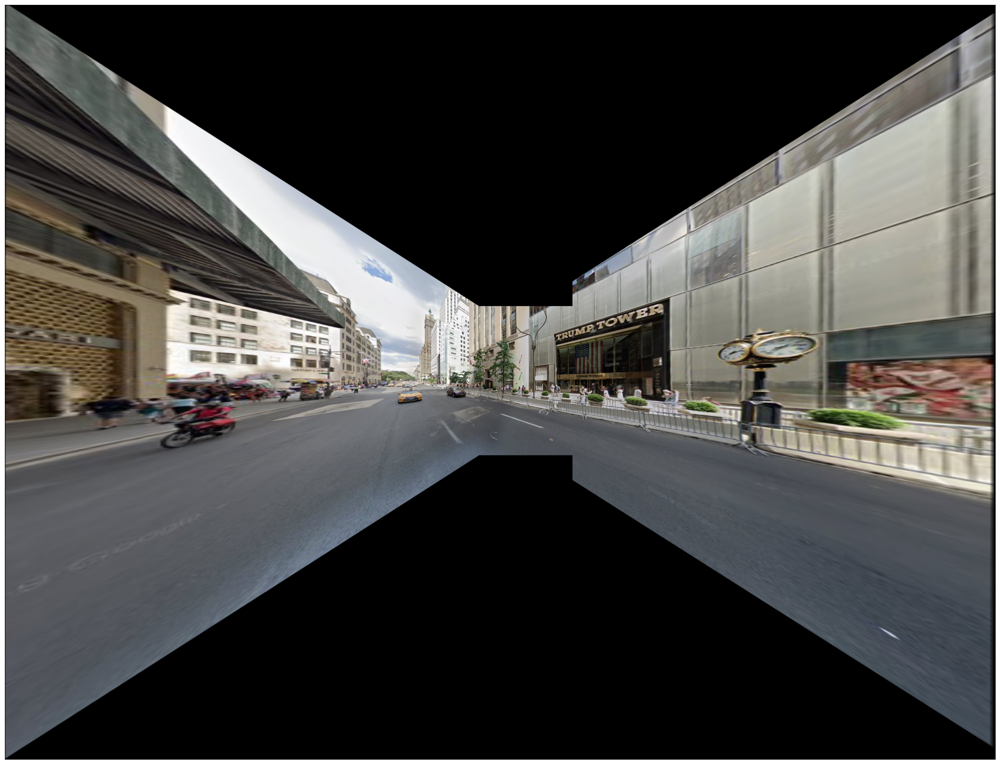

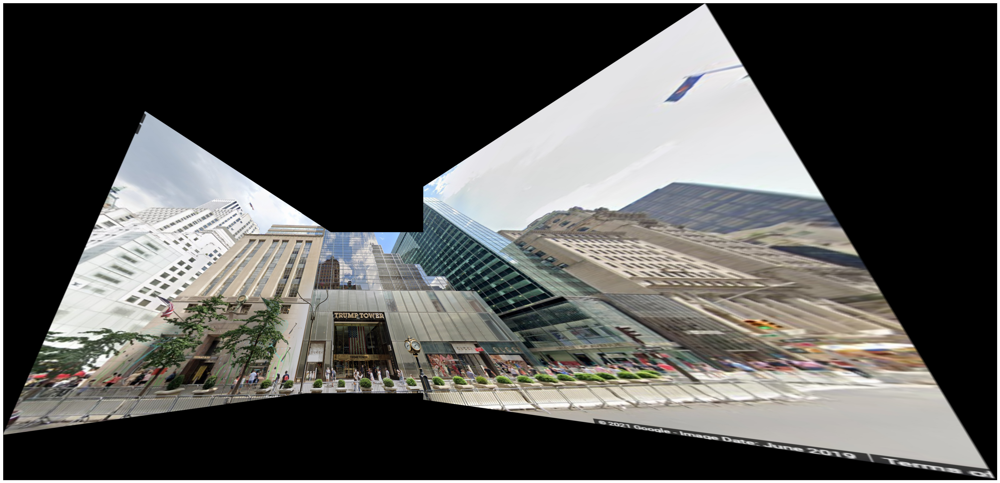

In [59]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.imshow(cv2.cvtColor(stitch, cv2.COLOR_BGR2RGB))
ax.set_xticks([])
ax.set_yticks([])
plt.show()

fig, ax = plt.subplots(figsize=(40, 20))
ax.imshow(cv2.cvtColor(stitch2, cv2.COLOR_BGR2RGB))
ax.set_xticks([])
ax.set_yticks([])
plt.show()


# Display the blended image
# cv2.imshow('Blended Image', stitch)
# cv2.waitKey(0)
# cv2.destroyAllWindows()